<a href="https://colab.research.google.com/github/MahtabNiakan/Yolo-models/blob/main/Yolo5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from random import choice
import shutil
from google.colab import files

In [ ]:
from google.colab import drive

In [ ]:

drive.mount('/content/drive') # importing googldrive as gdrive in colab

Mounted at /content/drive


In [ ]:
!Python -m pip install --upgrade pip
!pip install tensorflow
!pip install tensorboard

/bin/bash: line 1: Python: command not found


In [ ]:
!pip install torch

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [ ]:
import torch
from IPython.display import Image

In [ ]:
#delete yolo5 folder if exist
yolo_folder="/content/yolov5/"
if os.path.exists(yolo_folder):
   shutil.rmtree(yolo_folder)

# CLONNING ALGORITHM FROM GITHUB

In [ ]:

!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16625, done.
remote: Counting objects: 100% (103/103), done.
remote: Compressing objects: 100% (73/73), done.
remote: Total 16625 (delta 58), reused 66 (delta 30), pack-reused 16522
Receiving objects: 100% (16625/16625), 15.16 MiB | 15.13 MiB/s, done.
Resolving deltas: 100% (11415/11415), done.


In [ ]:

%cd yolov5

/content/yolov5


In [ ]:
!pip install -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.9/63.9 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.4/778.4 kB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.2 which is incompatible.
imageio 

In [ ]:
import time

# **Creating labels and images folders for Train/Val/Test**

In [ ]:
train_image_path="/content/yolov5/data/images/train"
if not os.path.exists(train_image_path):
   os.mkdir(train_image_path)

val_image_path="/content/yolov5/data/images/val"
if not os.path.exists(val_image_path):
   os.mkdir(val_image_path)

test_image_path="/content/yolov5/data/images/test"
if not os.path.exists(test_image_path):
   os.mkdir(test_image_path)

labels_folder="/content/yolov5/data/labels"
if not os.path.exists(labels_folder):
   os.mkdir(labels_folder)


train_labels_path="/content/yolov5/data/labels/train"
if not os.path.exists(train_labels_path):
   os.mkdir(train_labels_path)

val_labels_path="/content/yolov5/data/labels/val"
if not os.path.exists(val_labels_path):
   os.mkdir(val_labels_path)

test_labels_path="/content/yolov5/data/labels/test"
if not os.path.exists(test_labels_path):
   os.mkdir(test_labels_path)



In [ ]:
#shutil.rmtree('/content/yolov5/data/images/train')
# shutil.rmtree('/content/yolov5/data/images/val')
# shutil.rmtree('/content/yolov5/data/images/test')

# shutil.rmtree('/content/yolov5/data/labels/val')
# shutil.rmtree('/content/yolov5/data/labels/test')


# **Loading Data to Folders**

In [ ]:
### load third of all file :train images
directory_path_image="/content/drive/MyDrive/Symbols/Maori Symbols/images/train"
directory_path_labels="/content/drive/MyDrive/Symbols/Maori Symbols/labels/train"

all_files1 = sorted(os.listdir(directory_path_image))
#files_to_upload1 = all_files1[2::3]
for filename in all_files1:
    shutil.copy(os.path.join(directory_path_image, filename), os.path.join(train_image_path, filename))
all_files2 = sorted(os.listdir(directory_path_labels))
#files_to_upload2 = all_files2[2::3]
for filename in all_files2:
    shutil.copy(os.path.join(directory_path_labels, filename), os.path.join(train_labels_path, filename))



In [ ]:
# ### load third of all file :val/test images
# #25% of val images will put in the test folder . for every 3 val image 1 will move to test
directory_path_image="/content/drive/MyDrive/Symbols/Maori Symbols/images/val"
directory_path_labels="/content/drive/MyDrive/Symbols/Maori Symbols/labels/val"

all_files1 = sorted(os.listdir(directory_path_image))
#files_to_upload1 = all_files1[2::3]
files_to_upload1 = all_files1
ind=0
for filename in files_to_upload1:
    ind=ind+1
    if ind%4==0:
       shutil.copy(os.path.join(directory_path_image, filename), os.path.join(test_image_path, filename))
    else:
       shutil.copy(os.path.join(directory_path_image, filename), os.path.join(val_image_path, filename))


all_files2 = sorted(os.listdir(directory_path_labels))
#files_to_upload2 = all_files2[2::3]
files_to_upload2 = all_files2
ind=0
for filename in files_to_upload2:
     ind=ind+1
     if ind%4==0:
        shutil.copy(os.path.join(directory_path_labels, filename), os.path.join(test_labels_path, filename))
     else:
        shutil.copy(os.path.join(directory_path_labels, filename), os.path.join(val_labels_path, filename))





# **Number of images/labels in each folder**

In [ ]:
print(len(os.listdir(train_labels_path)))
print(len(os.listdir(val_labels_path)))
print(len(os.listdir(test_labels_path)))


2400
450
150


# Copy yaml file to the rood of YOLO5 model

In [ ]:
shutil.copy('/content/drive/MyDrive/dataset.yaml', '/content/yolov5/data/dataset.yaml')

'/content/yolov5/data/dataset.yaml'

# **Learning Yolo using our data**

In [ ]:
%cd yolov5

[Errno 2] No such file or directory: 'yolov5'
/content/yolov5


# **Training  data epoch 30 YOLOv5m.pt**

In [ ]:
!python train.py --img 415 --batch 16 --epochs 30 --data dataset.yaml --weights yolov5m.pt --cache

2024-05-26 21:32:35.110580: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-26 21:32:35.110642: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-26 21:32:35.234145: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5m.pt, cfg=, data=dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=415, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, opt

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# **APPLY MODEL ON TEST SET **
the confidency value save in the lable files

In [ ]:
!python detect.py --source /content/yolov5/data/images/test --weights /content/yolov5/runs/train/exp3/weights/best.pt --img-size 415 --conf 0.4 --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/exp3/weights/best.pt'], source=/content/yolov5/data/images/test, data=data/coco128.yaml, imgsz=[415, 415], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Traceback (most recent call last):
  File "/content/yolov5/detect.py", line 312, in <module>
    main(opt)
  File "/content/yolov5/detect.py", line 307, in main
    run(**vars(opt))
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/content/yolov5/detect.py", line 115, in run
    model = Detec

#Apply model on one common picture (for yolo5 and yolo8) and exporting the result

In [ ]:
# It is set for showing confidence more than 70% using command : --conf 0.7
#change the size of export using --line-thickness 1

!python detect.py --source /content/drive/MyDrive/shop1.jpg --weights /content/drive/MyDrive/best_yolo5.pt --conf 0.7 --line-thickness 1


detect: weights=['/content/drive/MyDrive/best_yolo5.pt'], source=/content/drive/MyDrive/shop1.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CPU

Fusing layers... 
Model summary: 212 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
image 1/1 /content/drive/MyDrive/shop1.jpg: 480x640 6 Hei Mataus, 4 Pikoruas, 1437.5ms
Speed: 9.1ms pre-process, 1437.5ms inference, 1.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp2


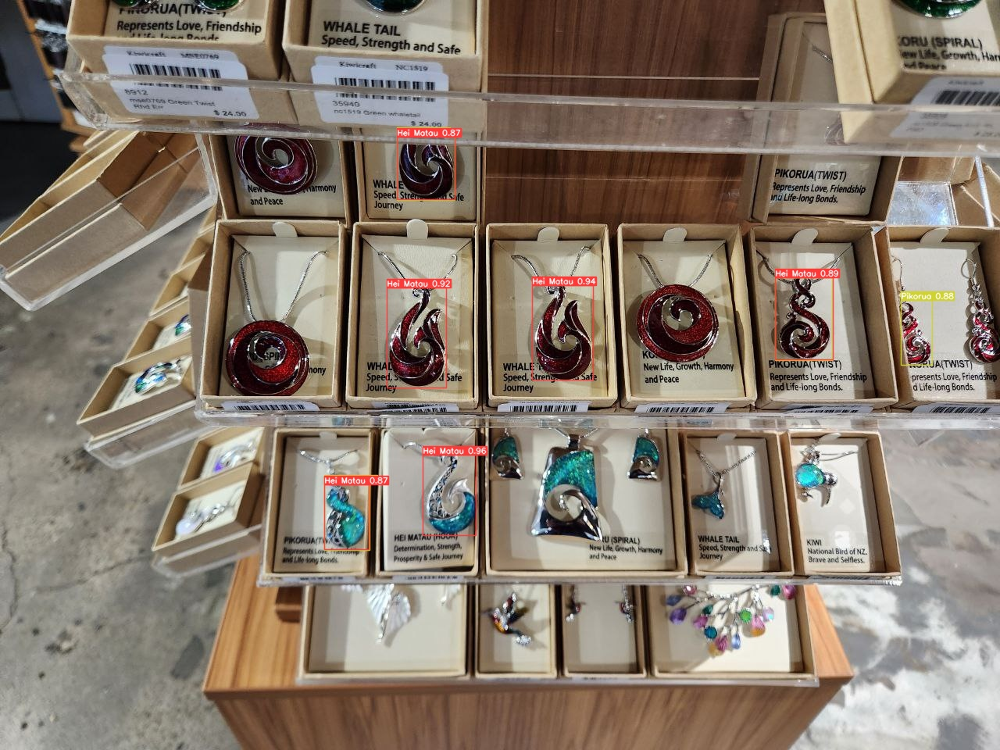

In [ ]:
Image('/content/yolov5/runs/detect/exp2/shop1.jpg')



In [ ]:

Image('runs/detect/exp5/test11.jpg')

# Applying the model on the movie

In [ ]:
## using model that from yolo runs
!python detect.py --source /content/drive/MyDrive/maori.mp4 --weights /content/yolov5/runs/train/exp/weights/best.pt  --img-size 415 --conf 0.4 --line-thickness 1

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/maori.mp4, data=data/coco128.yaml, imgsz=[415, 415], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ --img-size [415, 415] must be multiple of max stride 32, updating to [416, 416]
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/240) /content/drive/MyDrive/maori.mp4: 256x416 1 Hei Tiki, 51.9ms
video 1/1 (2/240) /content/drive/MyDrive/maori.mp4: 256x416 1 Hei Tiki, 11.4ms
video 1/1

In [ ]:
## using the weights from best file that saved in my google drive
!python detect.py --source /content/drive/MyDrive/shop_v4.mp4 --weights /content/drive/MyDrive/best_yolo5.pt  --img-size 415 --conf 0.4 --line-thickness 1

# Loading Tensorboard for visualising the result

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 13776), started 2:26:46 ago. (Use '!kill 13776' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --source /content/drive/MyDrive/shop_v2.mp4 --weights /content/drive/MyDrive/best.pt --img-size 415 --conf 0.5 --save-txt --save-conf

detect: weights=['/content/drive/MyDrive/best.pt'], source=/content/drive/MyDrive/shop_v2.mp4, data=data/coco128.yaml, imgsz=[415, 415], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-314-g60dde7f1 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20869098 parameters, 0 gradients, 47.9 GFLOPs
WARNING ⚠️ --img-size [415, 415] must be multiple of max stride 32, updating to [416, 416]
video 1/1 (1/279) /content/drive/MyDrive/shop_v2.mp4: 416x256 2 Hei Mataus, 1 Koru, 58.4ms
video 1/1 (2/279) /content/drive/MyDrive/shop_v2.mp4: 416x256 2 Hei Mataus, 1 Koru, 11.4ms
video 1/1 (3/279) /content/drive/MyDrive/sh

# Training model with epoch30 and **YOLOV5s**

In [ ]:
!python train.py --img 415 --batch 16 --epochs 60 --data dataset.yaml --weights yolov5s.pt --cache